In [1]:
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature

In [2]:
ds = xr.open_dataset('http://iridl.ldeo.columbia.edu/SOURCES/.NOAA/.NGDC/.GLOBE/.topo/dods')
y_sel = ds.Y.where((ds.Y>33) & (ds.Y<41),drop=True)
x_sel = ds.X.where((ds.X<-75) & (ds.X>-86),drop=True)
ds = ds.sel(Y=y_sel,X=x_sel)

In [3]:
ds.load()

<xarray.Dataset>
Dimensions:  (X: 1320, Y: 960)
Coordinates:
  * Y        (Y) float32 41.0 40.99 40.98 40.97 40.96 ... 33.03 33.02 33.01 33.0
  * X        (X) float32 -86.0 -85.99 -85.98 -85.97 ... -75.02 -75.01 -75.0
Data variables:
    topo     (Y, X) float32 258.0 259.0 249.0 242.0 247.0 ... nan nan nan nan
Attributes:
    Conventions:  IRIDL

In [4]:
names = ['Mount LeConte','Black Balsam Knob','Waterrock Knob',
     'Mount Guyot','Roan Highlands','Richland Balsam',
     'Clingman\'s Dome','Mount Mitchell','Black Mountain',
     'Butt Mountain','Spruce Knob','Thorny Flat (Cheat Mountain)',
     'Mount Porte Crayon','Weiss Knob','Grassy Knob',
     'Wright\'s Peak','Bald Knob', 'Kile Knob',
     'Gaudineer Knob (Shaver\'s Mountain)','Mount Rogers']

elevation = [6593,6214,6292,6621,6285,
             6410,6643,6684,4145,4210,
             4862,4848,4770,4440,4360,
             4073,4843,4577,4449,5728]
       
lats = [35.654167,35.327884,35.464268,35.705278,36.104556,
        35.367132,35.562872,35.764839,36.914167,37.369339,
        38.699756,38.395049,38.929025,38.993973,38.065234,
        37.476964,38.447778,38.616111,38.615278,36.659841]

lons = [-83.436667,-82.874298,-83.137643,-83.257472,-82.122342,
        -82.990086,-83.498496,-82.265122,-82.893889,-80.623212,
        -79.532993,-79.991849,-79.456167,-79.429992,-80.496607,
        -80.524716,-79.931111,-79.481944,-79.844167,-81.544558]

In [5]:
df = pd.DataFrame(list(zip(names, elevation,lats,lons)), 
               columns =['name', 'elevation','lat','lon']) 

In [6]:
df = df.sort_values('elevation',ascending=False).reset_index().drop('index',axis=1)
df

,name,elevation,lat,lon
0,Mount Mitchell,6684,35.764839,-82.265122
1,Clingman's Dome,6643,35.562872,-83.498496
2,Mount Guyot,6621,35.705278,-83.257472
3,Mount LeConte,6593,35.654167,-83.436667
4,Richland Balsam,6410,35.367132,-82.990086
5,Waterrock Knob,6292,35.464268,-83.137643
6,Roan Highlands,6285,36.104556,-82.122342
7,Black Balsam Knob,6214,35.327884,-82.874298
8,Mount Rogers,5728,36.659841,-81.544558
9,Spruce Knob,4862,38.699756,-79.532993


In [7]:
# https://www.arcgis.com/home/item.html?id=320a4a7a8d3a49488572635a82938bef
fname = 'appa_area.shp'
apptrail = ShapelyFeature(Reader(fname).geometries(),ccrs.PlateCarree())
proj = ccrs.AlbersEqualArea(central_longitude=df.lon.mean(), central_latitude=df.lat.mean())

In [8]:
def plot_contour_map(ds,proj,levels=[304.8,1219.2,1524,1828.8],rotation=57,gl=True,label=True,figsize=[24,24]):
    
    plt.figure(dpi=300,figsize=figsize)

    ax = plt.axes(projection=proj)

    ax.add_feature(apptrail,lw=0.2,facecolor='0.8',edgecolor='0.8')
    # ax.add_feature(brpkwy,lw=0.2,edgecolor='0.8')

    ax.contour(ds.X,ds.Y,ds.topo,levels=levels,colors=['#5A5353','#B5838D','#FFCEC2','#FFF2EB'],linewidths=0.15,
                transform=ccrs.PlateCarree()
               )

    ax.set_facecolor('0.05')

    peak_color = '#DE541E'
    peak_size = 0.2
    peak_zorder = 2

    for lat,lon,name in zip(lats,lons,elevation):
        
        ax.scatter(lon,lat,transform=ccrs.PlateCarree(),s=peak_size,c=peak_color,zorder=peak_zorder)
        
        if label:
            
            ax.text(lon+0.02,lat+0.01,f'{name}\'',transform=ccrs.PlateCarree(),c=peak_color,fontsize=5,rotation=rotation)
        
    if gl:
        
        ax.gridlines(draw_labels=False, x_inline=False, y_inline=False,linestyle='--',linewidth=0.5)
    
    return ax

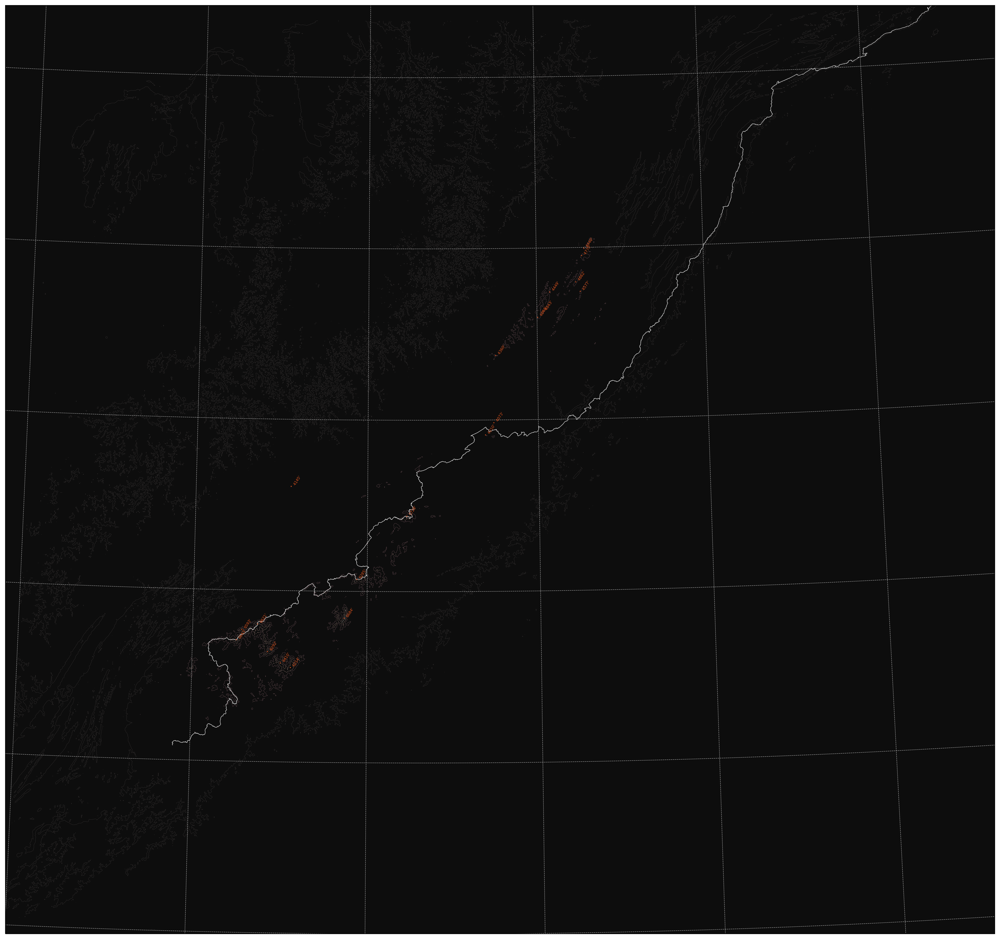

In [9]:
plot_contour_map(ds,proj)

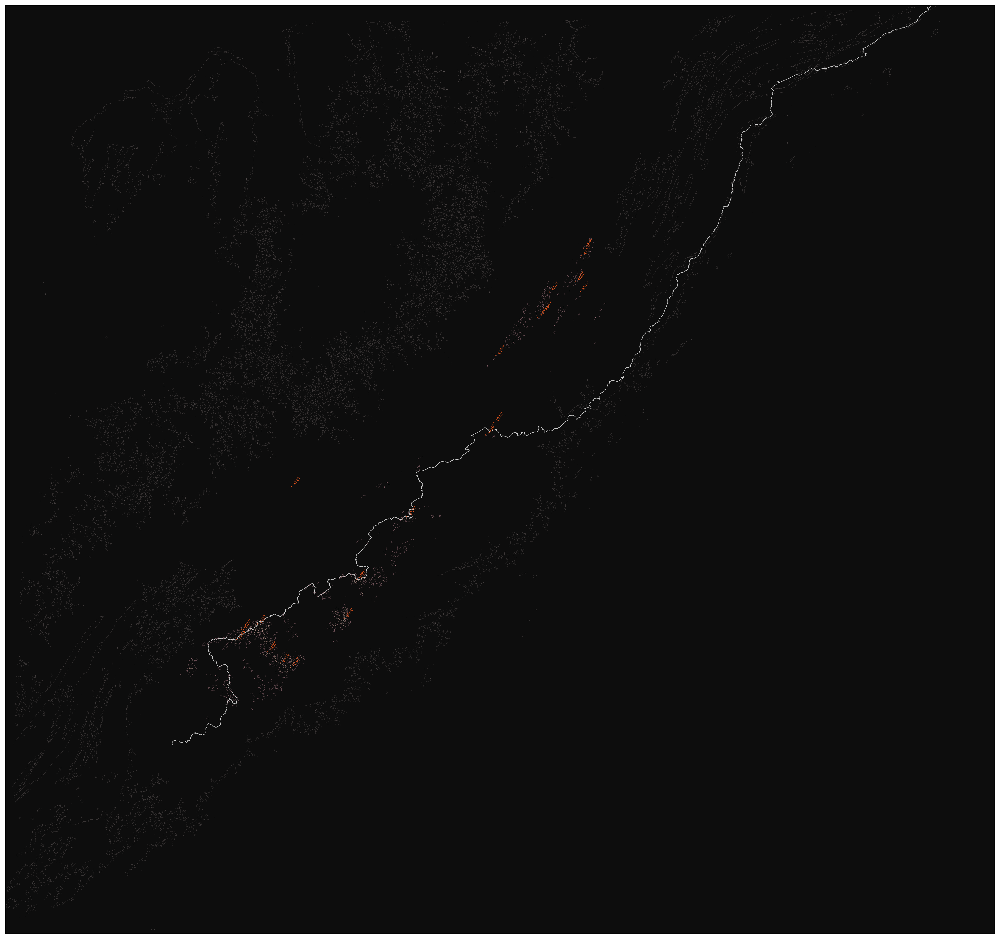

In [10]:
plot_contour_map(ds,proj,gl=False)

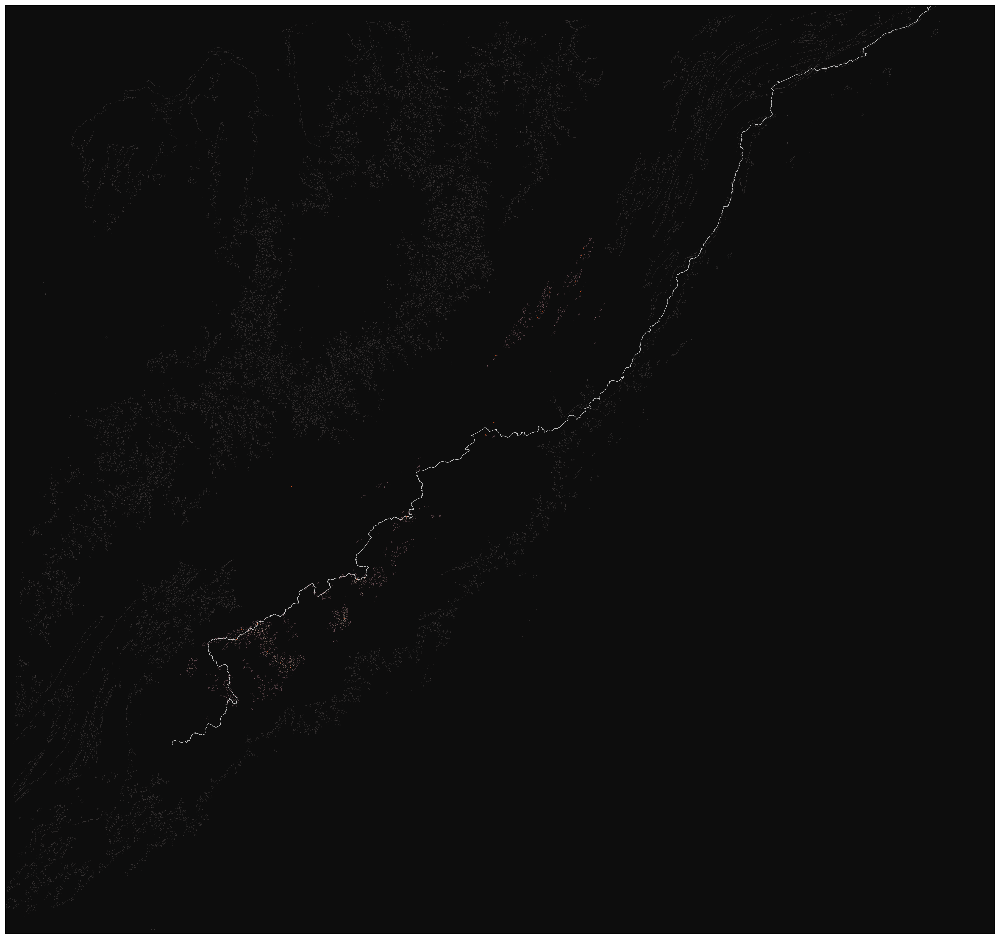

In [11]:
plot_contour_map(ds,proj,gl=False,label=False)